# Developing Mouse - Visual Cortex: 10X gene expression

In the [previous notebook](https://alleninstitute.github.io/abc_atlas_access/notebooks/dev_mouse_vis_cortex_clustering_analysis_and_annotation.html), we explored the integrated taxonomy and combined it with cell level and other metadata. In this notebook, we load and explore gene expression data, loading the expression of specific genes. We plot these expressions in the heatmaps, comparing the expression across the taxonomy and anatomical region, as well as show the gene expression in the UMAP. Finally, we show the scatter of expression values and their mean as a function of donor age for given cell types.

In [1]:
%matplotlib inline

import pandas as pd
import numpy as np
from pathlib import Path
import matplotlib.pyplot as plt
from typing import List, Optional, Tuple

from abc_atlas_access.abc_atlas_cache.abc_project_cache import AbcProjectCache
from abc_atlas_access.abc_atlas_cache.anndata_utils import get_gene_data

We will interact with the data using the **AbcProjectCache**. This cache object tracks which data has been downloaded and serves the path to the requested data on disk. For metadata, the cache can also directly serve up a Pandas DataFrame. See the [``getting_started``](https://alleninstitute.github.io/abc_atlas_access/notebooks/getting_started.html) notebook for more details on using the cache including installing it if it has not already been. 

**Change the download_base variable to where you would like to download the data to your system or a location where a cache is already available.**.**

In [2]:
download_base = Path('../../data/abc_atlas')
abc_cache = AbcProjectCache.from_cache_dir(
    download_base,
)

abc_cache.cache.manifest_file_names.append('releases/20260131/manifest.json')
abc_cache.load_manifest('releases/20260131/manifest.json')
abc_cache.current_manifest

/Users/chris.morrison/src/abc_atlas_access/src/abc_atlas_access/abc_atlas_cache/cloud_cache.py:665: UserWarning: The manifest version recorded as last used for this cache -- releases/20260131/manifest.json-- is not a valid manifest for this dataset. Loading latest version -- releases/20251031/manifest.json -- instead.
  warnings.warn(msg, UserWarning)
/Users/chris.morrison/src/abc_atlas_access/src/abc_atlas_access/abc_atlas_cache/cloud_cache.py:697: OutdatedManifestWarning: You are loading
releases/20251031/manifest.json
which is newer than the most recent manifest file you have previously been working with
releases/20260131/manifest.json
It is possible that some data files have changed between these two data releases, which will force you to re-download those data files (currently downloaded files will not be overwritten). To continue using releases/20260131/manifest.json, run
type.load_manifest('releases/20260131/manifest.json')
  warnings.warn(msg, OutdatedManifestWarning)


'releases/20260131/manifest.json'

Below we create the expanded cell metadata as was done previously in the [cluster annotation tutorial](https://alleninstitute.github.io/abc_atlas_access/notebooks/dev_mouse_clustering_analysis_and_annotation.html).

In [3]:
cell_to_cluster_membership = abc_cache.get_metadata_dataframe(
    'Developing-Mouse-Vis-Cortex-taxonomy', 'cell_to_cluster_membership'
).set_index('cell_label')
cluster = abc_cache.get_metadata_dataframe(
    'Developing-Mouse-Vis-Cortex-taxonomy', 'cluster'
).set_index('label')
cluster_annotation_term = abc_cache.get_metadata_dataframe(
    'Developing-Mouse-Vis-Cortex-taxonomy', 'cluster_annotation_term'
).set_index('label')

cluster_annotation_term_set = abc_cache.get_metadata_dataframe(
    directory='Developing-Mouse-Vis-Cortex-taxonomy',
    file_name='cluster_annotation_term_set'
).set_index('label')

cluster_to_cluster_annotation_membership = abc_cache.get_metadata_dataframe(
    directory='Developing-Mouse-Vis-Cortex-taxonomy',
    file_name='cluster_to_cluster_annotation_membership'
).set_index('cluster_annotation_term_label')

cell_metadata = abc_cache.get_metadata_dataframe('Developing-Mouse-Vis-Cortex-10X', 'cell_metadata').set_index('cell_label')
membership_with_cluster_info = cluster_to_cluster_annotation_membership.join(
    cluster.reset_index().set_index('cluster_alias')[['number_of_cells']],
    on='cluster_alias'
)

membership_with_cluster_info = membership_with_cluster_info.join(cluster_annotation_term, rsuffix='_anno_term').reset_index()

membership_groupby = membership_with_cluster_info.groupby(
    ['cluster_alias', 'cluster_annotation_term_set_name']
)

cluster_details = membership_groupby['cluster_annotation_term_name'].first().unstack()
cluster_order = membership_groupby['term_order'].first().unstack()

cluster_colors = membership_groupby['color_hex_triplet'].first().unstack()
cluster_colors = cluster_colors[cluster_annotation_term_set['name']]

cell_extended = cell_metadata.join(cell_to_cluster_membership, how='inner')
cell_extended = cell_extended.join(cluster_details, on='cluster_alias')
cell_extended = cell_extended.join(cluster_colors, on='cluster_alias', rsuffix='_color')
cell_extended = cell_extended.join(cluster_order, on='cluster_alias', rsuffix='_order')

library = abc_cache.get_metadata_dataframe(
    directory='Developing-Mouse-Vis-Cortex-10X',
    file_name='library'
).set_index('library_label')
donor = abc_cache.get_metadata_dataframe(
    directory='Developing-Mouse-Vis-Cortex-10X',
    file_name='donor'
).set_index('donor_label')
for idx, row in donor.iterrows():
    if row['donor_age'] in ['P54', 'P59', 'P60', 'P61', 'P68']:
        donor.loc[idx, 'donor_age'] = 'P56'

cell_extended = cell_extended.join(library, on='library_label', rsuffix='_lib')
cell_extended = cell_extended.join(donor, on='donor_label', rsuffix='_donor')

value_sets = abc_cache.get_metadata_dataframe(
    directory='Developing-Mouse-Vis-Cortex-10X',
    file_name='value_sets'
).set_index('label')

def extract_value_set(
        cell_metadata_df: pd.DataFrame,
        input_value_set: pd.DataFrame,
        input_value_set_label: str,
        dataframe_column: Optional[str] = None
    ):
    """Add color and order columns to the cell metadata dataframe based on the input
    value set.

    Columns are added as {input_value_set_label}_color and {input_value_set_label}_order.

    Parameters
    ----------
    cell_metadata_df : pd.DataFrame
        DataFrame containing cell metadata.
    input_value_set : pd.DataFrame
        DataFrame containing the value set information.
    input_value_set_label : str
        The the column name to extract color and order information for. will be added to the cell metadata.
    """
    if dataframe_column is None:
        dataframe_column = input_value_set_label
    cell_metadata_df[f'{dataframe_column}_color'] = input_value_set[
        input_value_set['field'] == input_value_set_label
    ].loc[cell_metadata_df[dataframe_column]]['color_hex_triplet'].values
    cell_metadata_df[f'{dataframe_column}_order'] = input_value_set[
        input_value_set['field'] == input_value_set_label
    ].loc[cell_metadata_df[dataframe_column]]['order'].values

# Add region of interest color and order
extract_value_set(cell_extended, value_sets, 'region_of_interest_label')
# Add region of interest color and order
extract_value_set(cell_extended, value_sets, 'synchronized_age')
extract_value_set(cell_extended, value_sets, 'synchronized_age', 'donor_age')
# Add region of interest color and order
extract_value_set(cell_extended, value_sets, 'age_bin')
# Add species common name color and order
extract_value_set(cell_extended, value_sets, 'species_genus')
# Add species scientific name color and order
extract_value_set(cell_extended, value_sets, 'species_scientific_name')
# Add donor sex color and order
extract_value_set(cell_extended, value_sets, 'donor_sex')
cell_extended.head()

,cell_barcode,barcoded_cell_sample_label,library_label,alignment_id,log.qc.score.cr6,synchronized_age,donor_label,dataset_label,feature_matrix_label,cluster_alias,...,donor_age_color,donor_age_order,age_bin_color,age_bin_order,species_genus_color,species_genus_order,species_scientific_name_color,species_scientific_name_order,donor_sex_color,donor_sex_order
cell_label,,,,,,,,,,,,,,,,,,,,,
AAACCCAAGGATTTAG-898_A02,AAACCCAAGGATTTAG,898_A02,L8TX_211028_01_G04,1157582505,338.986629,E13.5,C67BL6J-606627,Developing-Mouse-Vis-Cortex-10X,Developing-Mouse-Vis-Cortex-10X,50,...,#E6865C,3,#D38F38,2,#c941a7,1,#ffa300,1,#ADC4C3,2
AAACCCACACATTCTT-898_A02,AAACCCACACATTCTT,898_A02,L8TX_211028_01_G04,1157582505,425.642457,E13.5,C67BL6J-606627,Developing-Mouse-Vis-Cortex-10X,Developing-Mouse-Vis-Cortex-10X,122,...,#E6865C,3,#D38F38,2,#c941a7,1,#ffa300,1,#ADC4C3,2
AAACCCACACTTACAG-898_A02,AAACCCACACTTACAG,898_A02,L8TX_211028_01_G04,1157582505,342.366675,E13.5,C67BL6J-606627,Developing-Mouse-Vis-Cortex-10X,Developing-Mouse-Vis-Cortex-10X,118,...,#E6865C,3,#D38F38,2,#c941a7,1,#ffa300,1,#ADC4C3,2
AAACGAATCACTCTTA-898_A02,AAACGAATCACTCTTA,898_A02,L8TX_211028_01_G04,1157582505,353.204604,E13.5,C67BL6J-606627,Developing-Mouse-Vis-Cortex-10X,Developing-Mouse-Vis-Cortex-10X,108,...,#E6865C,3,#D38F38,2,#c941a7,1,#ffa300,1,#ADC4C3,2
AAACGAATCGACCAAT-898_A02,AAACGAATCGACCAAT,898_A02,L8TX_211028_01_G04,1157582505,355.052147,E13.5,C67BL6J-606627,Developing-Mouse-Vis-Cortex-10X,Developing-Mouse-Vis-Cortex-10X,690,...,#E6865C,3,#D38F38,2,#c941a7,1,#ffa300,1,#ADC4C3,2


### Single cell and nuclei transcriptomes

Below we use the convenience function `get_gene_data` to download and extract specific genes from the gene expression h5ad files. This function can be used to pull expression for the full set of cells or any subset from the set of cell metadata for specific genes. See [accessing gene expression data tutorial](https://alleninstitute.github.io/abc_atlas_access/notebooks/general_accessing_10x_snRNASeq_tutorial.html) for more information.

We first load the set of genes for these data.

In [4]:
gene = abc_cache.get_metadata_dataframe(
    directory='Developing-Mouse-Vis-Cortex-10X',
    file_name='gene'
).set_index('gene_identifier')
print("Number of aligned genes = ", len(gene))
gene.head(5)

gene.csv: 100%|██████████| 2.30M/2.30M [00:00<00:00, 3.80MMB/s]

Number of aligned genes =  32285


,gene_symbol,name,mapped_ncbi_identifier,comment
gene_identifier,,,,
ENSMUSG00000051951,Xkr4,X-linked Kx blood group related 4,NCBIGene:497097,NaN
ENSMUSG00000089699,Gm1992,predicted gene 1992,NaN,NaN
ENSMUSG00000102331,Gm19938,"predicted gene, 19938",NaN,NaN
ENSMUSG00000102343,Gm37381,"predicted gene, 37381",NaN,NaN
ENSMUSG00000025900,Rp1,retinitis pigmentosa 1 (human),NCBIGene:19888,NaN


Below we list the genes we will use in this notebook and the example method used to load the expression for these specific genes from the h5ad file. Note that we provide a set of example gene expressions as a csv file for brevity in this tutorial. These are selected as some of the more variable genes with age as shown in [this figure](https://www.nature.com/articles/s41586-025-09644-1/figures/4). Note however, that the expression levels shown here will be different as they are not scaled as in that figure.

To process and extract the gene expressions for yourself, uncomment the code block below. Warning that this is a large amount of data and may take a significant fraction of time to download. This download action will only need to be performed once, however.

For more details on how to extract specific genes from the data see our [accessing gene expression data tutorial](https://alleninstitute.github.io/abc_atlas_access/notebooks/general_accessing_10x_snRNASeq_tutorial.html)

In [5]:
gene_names = ['Neurod1', 'Cux2', 'Fezf2', 'Prox1', 'Olig2']

"""gene_data = get_gene_data(
    abc_atlas_cache=abc_cache,
    all_cells=cell_metadata,
    all_genes=gene,
    selected_genes=gene_names
)"""

'gene_data = get_gene_data(\n    abc_atlas_cache=abc_cache,\n    all_cells=cell_metadata,\n    all_genes=gene,\n    selected_genes=gene_names\n)'

We also provide the list of DE genes that were found to have varying expression across age. Any of these would be an interesting candidate to load the expression of as above.

In [6]:
de_genes = abc_cache.get_metadata_dataframe(
    directory='Developing-Mouse-Vis-Cortex-taxonomy',
    file_name='de_genes'
).set_index('gene_identifier')
de_genes.head()

de_genes.csv: 100%|██████████| 174k/174k [00:00<00:00, 1.21MMB/s] 


,gene_symbol
gene_identifier,
ENSMUSG00000039717,Ralyl
ENSMUSG00000028351,Brinp1
ENSMUSG00000039542,Ncam1
ENSMUSG00000079157,Fam155a
ENSMUSG00000040118,Cacna2d1


Instead of processing the gene expressions, we load pre-processed files containing the log gene expression for the genes listed above. The expression in the table below are presented as log2(CPM + 1).

In [7]:
gene_data = abc_cache.get_metadata_dataframe(
    directory='Developing-Mouse-Vis-Cortex-10X',
    file_name='example_gene_expression'
).set_index('cell_label')
gene_data

example_gene_expression.csv: 100%|██████████| 29.8M/29.8M [00:03<00:00, 8.14MMB/s]  


,Prox1,Neurod1,Cux2,Fezf2,Olig2
cell_label,,,,,
AAACCCAAGGATTTAG-898_A02,0.000000,0.000000,6.947625,5.959266,0.0
AAACCCACACATTCTT-898_A02,0.000000,5.636750,7.935293,0.000000,0.0
AAACCCACACTTACAG-898_A02,0.000000,0.000000,0.000000,0.000000,0.0
AAACGAATCACTCTTA-898_A02,6.079947,8.063863,5.101118,7.650621,0.0
AAACGAATCGACCAAT-898_A02,0.000000,0.000000,0.000000,0.000000,0.0
...,...,...,...,...,...
TTTGTTGCATCGGAAG-477_B01,0.000000,0.000000,7.371591,0.000000,0.0
TTTGTTGGTACTCAAC-477_B01,0.000000,4.546608,0.000000,0.000000,0.0
TTTGTTGGTGACTATC-477_B01,0.000000,0.000000,0.000000,7.648884,0.0


We load and merge the expression into each of our cell metadata.

In [8]:
cell_extended = cell_extended.join(gene_data)

## Example use cases

In this section, we show a use case plotting our sets of genes. First we'll show the gene expression in heatmaps plotted against ROI, age, and taxonomy. Then we'll plot the genes in a UMAP and finally we'll show violin plots of the expression as a function of age for specific cell types.

### Heatmap of Average gene expression

The helper function below creates a heatmap showing the relation between various parameters in the combined cell metadata and the genes we loaded.

In [9]:
import matplotlib as mpl

def plot_heatmap(
    df: pd.DataFrame,
    gnames: List[str],
    value: str,
    sort: bool = False,
    fig_width: float = 8,
    fig_height: float = 4,
    vmax: float = None,
    cmap: plt.cm = plt.cm.magma,
    value_set: Optional[pd.DataFrame] = None
):
    """Plot a heatmap of gene expression values for a list of genes across species.

    Parameters
    ----------
    df : pd.DataFrame
        DataFrame containing cell metadata and gene expression values.
    gnames : list
        List of gene names to plot.
    value : str
        Column name in df to group by (e.g., 'species_genus').
    sort : bool, optional
        Whether to sort the gene expression values within each species.
    fig_width : float, optional
        Width of the figure in inches.
    fig_height : float, optional
        Height of the figure in inches.
    vmax : float, optional
        Maximum value for the color scale. If None, it is set to the maximum value in the data.
    cmap : matplotlib colormap, optional
        Colormap to use for the heatmap.

    Returns
    -------
    fig : matplotlib.figure.Figure
        The figure object containing the heatmap.
    ax : array of matplotlib.axes.Axes
        The axes objects for each species.
    """

    fig, ax = plt.subplots(1, 1)
    fig.set_size_inches(fig_width, fig_height)

    grouped = df.groupby(value)[gnames].mean()
    vmin = grouped.min().min()
    vmax = grouped.max().max()
    norm = mpl.colors.Normalize(vmin=vmin, vmax=vmax)
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    cmap = sm.get_cmap()

    if sort:
        grouped = grouped.sort_values(by=gnames[0], ascending=False)
        grouped = grouped.loc[sorted(grouped.index)]

    if value_set is not None:
        value_order = value_set.loc[grouped.index][['order']]
        grouped = grouped.loc[
            value_order.sort_values('order').index
        ]

    arr = grouped.to_numpy().astype('float')

    ax.imshow(arr, cmap=cmap, aspect='auto', vmin=vmin, vmax=vmax)
    xlabs = grouped.columns.values
    ylabs = grouped.index.values


    ax.set_yticks(range(len(ylabs)))
    ax.set_yticklabels(ylabs)
    ax.set_xticks(range(len(xlabs)))
    ax.set_xticklabels(xlabs)

    cbar = fig.colorbar(sm, ax=ax, orientation='vertical', fraction=0.01, pad=0.01)
    cbar.set_label('Mean Expression [log2(CPM + 1)]')
    plt.subplots_adjust(wspace=0.00, hspace=0.00)
    
    return fig, ax

We now use the above function to show the average expression across class and subclass.

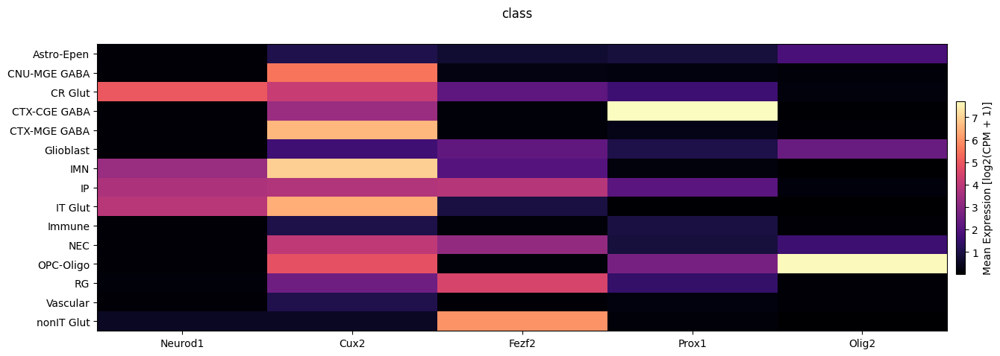

In [10]:
fig, ax = plot_heatmap(
    df=cell_extended,
    gnames=gene_names,
    value='class',
    fig_width=15,
    fig_height=5
)
fig.suptitle('class')
plt.show()

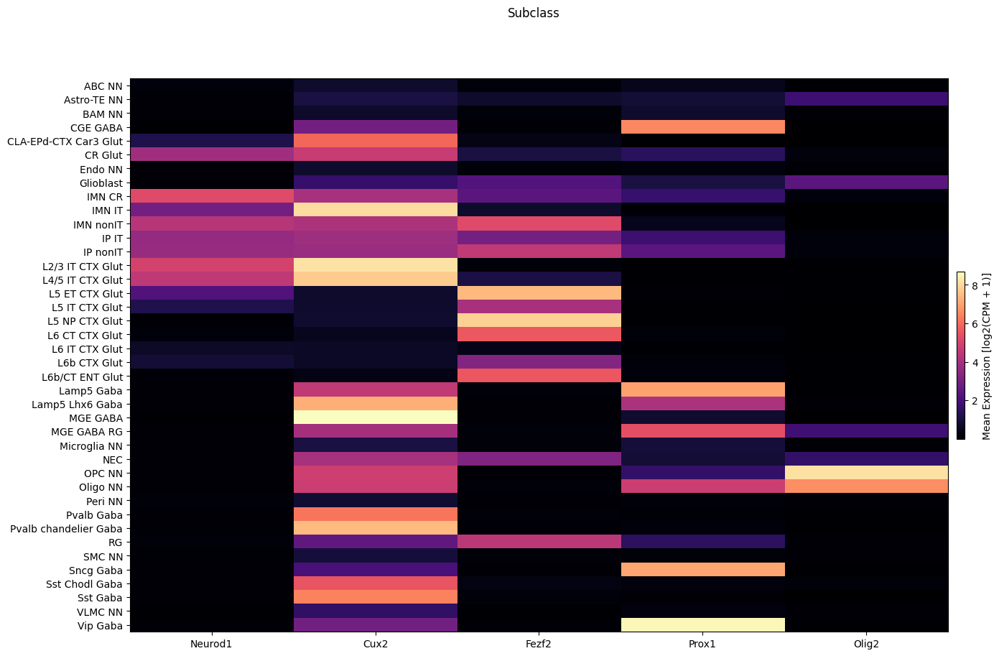

In [11]:
fig, ax = plot_heatmap(
    df=cell_extended,
    gnames=gene_names,
    value='subclass',
    fig_width=15,
    fig_height=10,
    sort=True
)
fig.suptitle('Subclass')
plt.show()

Nex, we break down the expression by region of interest.

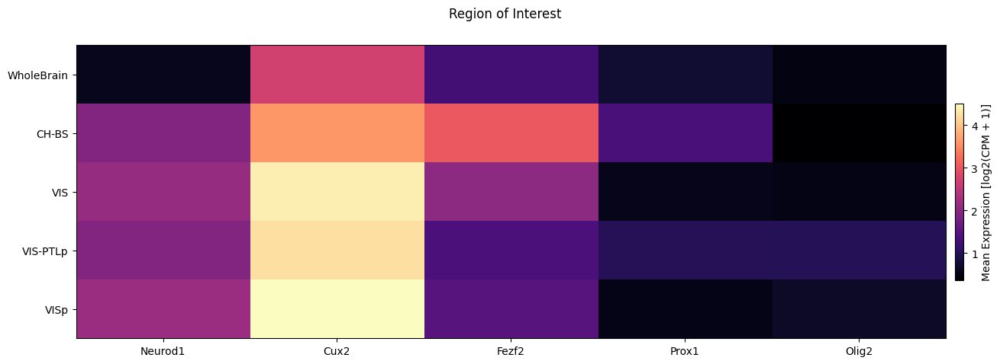

In [12]:
fig, ax = plot_heatmap(
    df=cell_extended,
    gnames=gene_names,
    value='region_of_interest_label',
    fig_width=15,
    fig_height=5,
    sort=True,
    value_set=value_sets[value_sets['field'] == 'region_of_interest_label']
)
fig.suptitle('Region of Interest')
plt.show()

Finally we show the average expression in the heat vs the age bins.

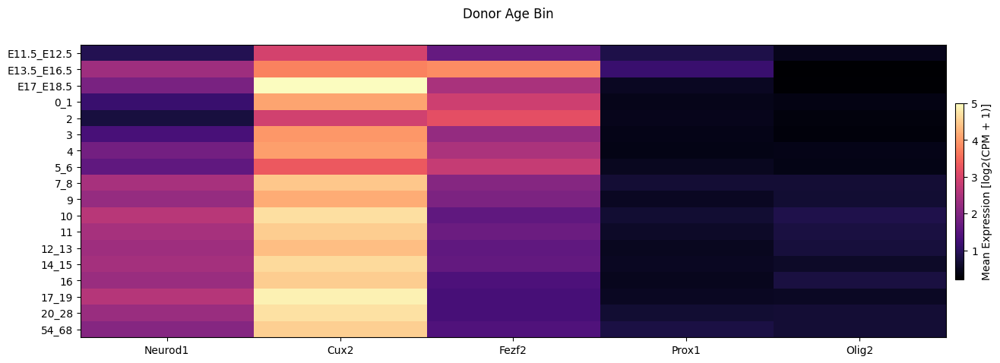

In [13]:
fig, ax = plot_heatmap(
    df=cell_extended,
    gnames=gene_names,
    value='age_bin',
    fig_width=15,
    fig_height=5,
    sort=True,
    value_set=value_sets[value_sets['field'] == 'age_bin']
)
fig.suptitle('Donor Age Bin')
plt.show()

## Expression in the UMAP

We load the UMAP coordinates for our cells and plot the expression in the UMAP for each of our selected genes. The UMAP is the same as the [previous notebook](https://alleninstitute.github.io/abc_atlas_access/notebooks/dev_mouse_clustering_analysis_and_annotation.html).

In [14]:
cell_2d_embedding_coordinates = abc_cache.get_metadata_dataframe(
    directory='Developing-Mouse-Vis-Cortex-taxonomy',
    file_name='cell_2d_embedding_coordinates'
).set_index('cell_label')
cell_2d_embedding_coordinates.head()

,x,y
cell_label,,
AAACCCAAGGATTTAG-898_A02,17.504883,4.327579
AAACCCACACATTCTT-898_A02,9.755900,5.404129
AAACCCACACTTACAG-898_A02,10.902691,4.540480
AAACGAATCACTCTTA-898_A02,13.066967,4.577918
AAACGAATCGACCAAT-898_A02,18.801212,-2.231872


Join the coordinates into the cell metadata.

In [15]:
cell_extended = cell_extended.join(
    cell_2d_embedding_coordinates
).sample(frac=1)
cell_extended.head()

,cell_barcode,barcoded_cell_sample_label,library_label,alignment_id,log.qc.score.cr6,synchronized_age,donor_label,dataset_label,feature_matrix_label,cluster_alias,...,species_scientific_name_order,donor_sex_color,donor_sex_order,Prox1,Neurod1,Cux2,Fezf2,Olig2,x,y
cell_label,,,,,,,,,,,,,,,,,,,,,
TGCCGAGGTGAGAGGG-265_A02,TGCCGAGGTGAGAGGG,265_A02,L8TX_200618_01_H05,1157582268,396.6404,P12,Snap25-IRES2-Cre;Ai14-536764,Developing-Mouse-Vis-Cortex-10X,Developing-Mouse-Vis-Cortex-10X,312,...,1,#565353,1,0.0,0.000000,0.000000,0.000000,0.0,-2.580804,12.106820
TCGTAGAAGGGCCCTT-265_B02,TCGTAGAAGGGCCCTT,265_B02,L8TX_200618_01_D07,1157582271,373.4990,P14,Snap25-IRES2-Cre;Ai14-536764,Developing-Mouse-Vis-Cortex-10X,Developing-Mouse-Vis-Cortex-10X,217,...,1,#565353,1,0.0,0.000000,0.000000,7.158025,0.0,5.039016,17.993940
TAAGCACAGTCTACCA-281_A01,TAAGCACAGTCTACCA,281_A01,L8TX_200709_01_C04,1157582302,386.4131,P14,Snap25-IRES2-Cre;Ai14-538742,Developing-Mouse-Vis-Cortex-10X,Developing-Mouse-Vis-Cortex-10X,433,...,1,#ADC4C3,2,0.0,5.678379,8.712266,0.000000,0.0,-3.418766,-2.813784
ACGATGTTCCTCATAT-482_A06,ACGATGTTCCTCATAT,482_A06,L8TX_210107_01_D09,1157582376,367.6436,P19,Snap25-IRES2-Cre;Ai14-562459,Developing-Mouse-Vis-Cortex-10X,Developing-Mouse-Vis-Cortex-10X,407,...,1,#ADC4C3,2,0.0,4.980261,7.747898,0.000000,0.0,-6.233597,4.269785
AAGTCGTAGTCATGCT-444_B04,AAGTCGTAGTCATGCT,444_B04,L8TX_201204_01_E01,1178468152,414.1543,P56,Snap25-IRES2-Cre;Ai14-553680,Developing-Mouse-Vis-Cortex-10X,Developing-Mouse-Vis-Cortex-10X,218,...,1,#ADC4C3,2,0.0,0.000000,0.000000,0.000000,0.0,6.902473,20.159367


We use the same UMAP plotting convenience function as previously used in the [Developing Mouse clustering and annotation tutorial](https://alleninstitute.github.io/abc_atlas_access/notebooks/dev_mouse_clustering_analysis_and_annotation.html).

In [16]:
def plot_umap(
    xx: np.ndarray,
    yy: np.ndarray,
    cc: np.ndarray = None,
    val: np.ndarray = None,
    fig_width: float = 8,
    fig_height: float = 8,
    cmap: Optional[plt.Colormap] = None,
    labels: np.ndarray = None,
    term_orders: np.ndarray = None,
    colorbar: bool = False,
    sizes: np.ndarray = None,
    fig: plt.Figure = None,
    ax: plt.Axes = None,
 ) -> Tuple[plt.Figure, plt.Axes]:
    """
    Plot a scatter plot of the UMAP coordinates.

    Parameters
    ----------
    xx : array-like
        x-coordinates of the points to plot.
    yy : array-like
        y-coordinates of the points to plot.
    cc : array-like, optional
        colors of the points to plot. If None, the points will be colored by the values in `val`.
    val : array-like, optional
        values of the points to plot. If None, the points will be colored by the values in `cc`.
    fig_width : float, optional
        width of the figure in inches. Default is 8.
    fig_height : float, optional
        height of the figure in inches. Default is 8.
    cmap : str, optional
        colormap to use for coloring the points. If None, the points will be colored by the values in `cc`.
    labels : array-like, optional
        labels for the points to plot. If None, no labels will be added to the plot.
    term_orders : array-like, optional
        order of the labels for the legend. If None, the labels will be ordered by their appearance in `labels`.
    colorbar : bool, optional
        whether to add a colorbar to the plot. Default is False.
    sizes : array-like, optional
        sizes of the points to plot. If None, all points will have the same size.
    fig : matplotlib.figure.Figure, optional
        figure to plot on. If None, a new figure will be created with 1 subplot.
    ax : matplotlib.axes.Axes, optional
        axes to plot on. If None, a new figure will be created with 1 subplot.
    """

    if sizes is None:
        sizes = 1
    if ax is None or fig is None:
        fig, ax = plt.subplots()
        fig.set_size_inches(fig_width, fig_height)

    if cmap is not None:
        scatt = ax.scatter(xx, yy, c=val, s=0.5, marker='.', cmap=cmap, alpha=sizes)
    elif cc is not None:
        scatt = ax.scatter(xx, yy, c=cc, s=0.5, marker='.', alpha=sizes)

    if labels is not None:
        from matplotlib.patches import Rectangle
        unique_label_colors = (labels + ',' + cc).unique()
        unique_labels = np.array([label_color.split(',')[0] for label_color in unique_label_colors])
        unique_colors = np.array([label_color.split(',')[1] for label_color in unique_label_colors])

        if term_orders is not None:
            unique_order = term_orders.unique()
            term_order = np.argsort(unique_order)
            unique_labels = unique_labels[term_order]
            unique_colors = unique_colors[term_order]
            
        rects = []
        for color in unique_colors:
            rects.append(Rectangle((0, 0), 1, 1, fc=color))

        legend = ax.legend(rects, unique_labels, loc=0)
        # ax.add_artist(legend)
    
    ax.set_xticks([])
    ax.set_yticks([])

    if colorbar:
        fig.colorbar(scatt, ax=ax)
    
    return fig, ax

Below we plot the genes in our set next to the UMAP colored by age bin.

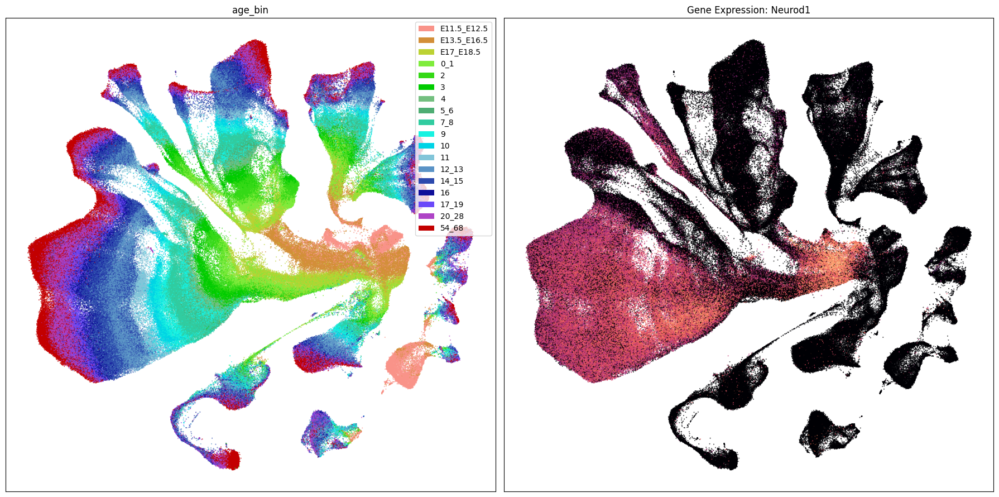

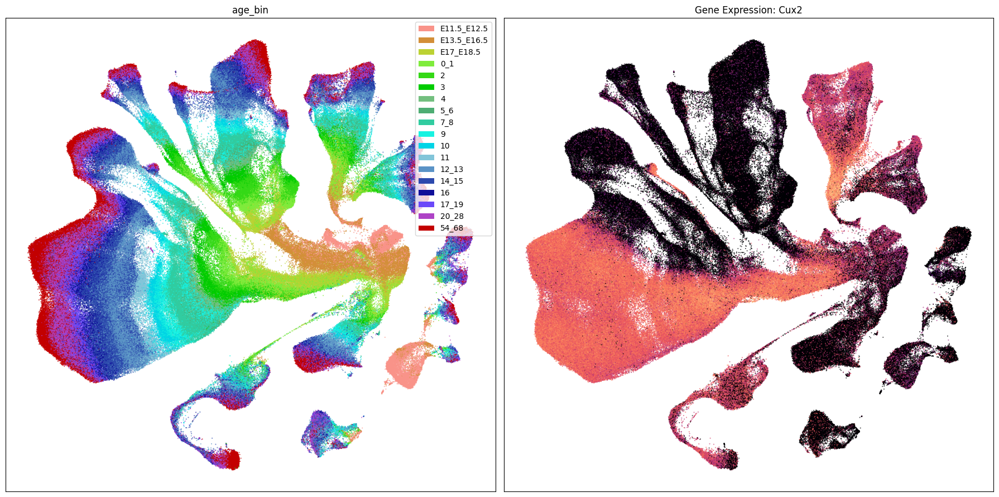

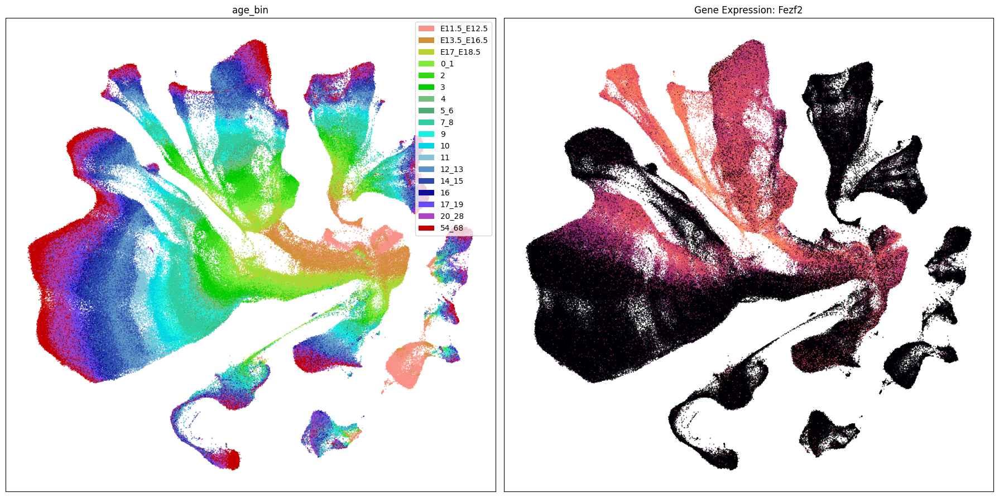

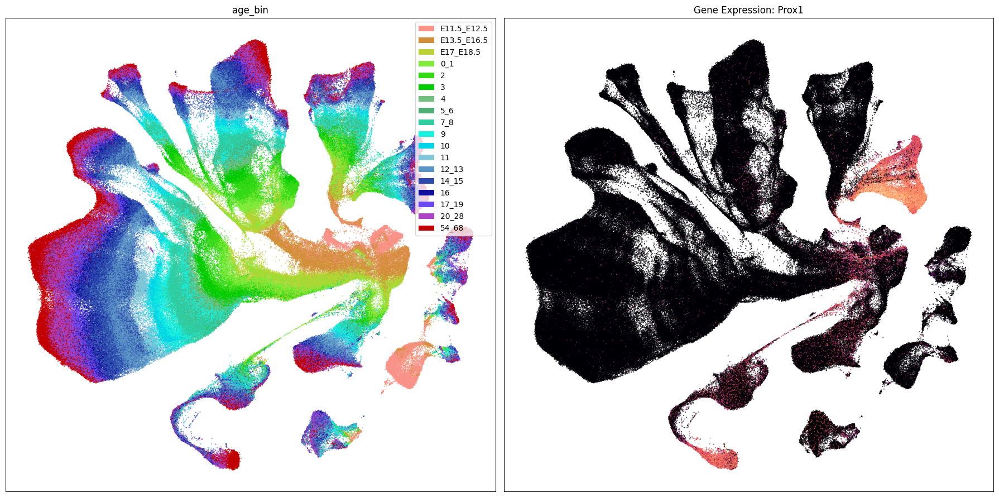

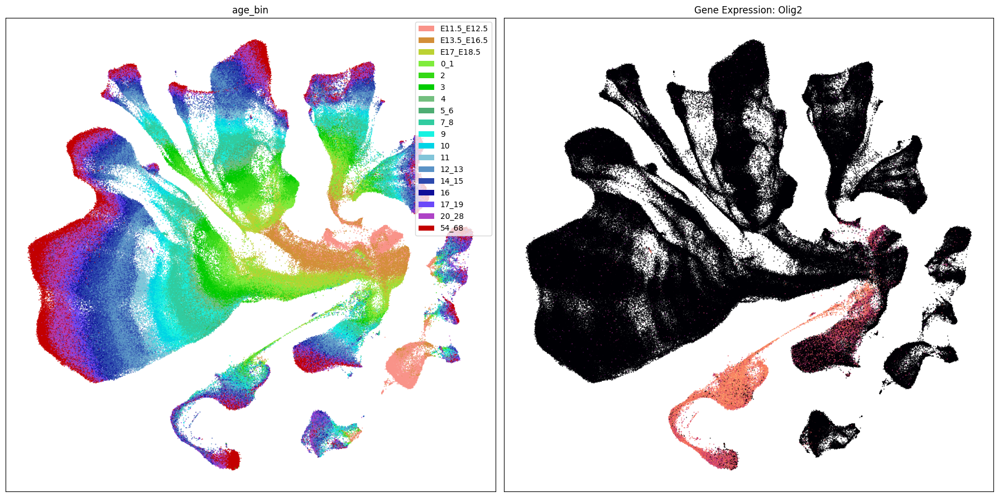

In [17]:
term_to_plot = 'age_bin'

# Plot UMAPs for the first two genes in gene_names
for gene_name in gene_names:
    fig, ax = plt.subplots(1, 2)
    fig.set_size_inches(18, 9)
    ax = ax.flatten()
    plot_umap(
        cell_extended['x'],
        cell_extended['y'],
        cc=cell_extended[term_to_plot + '_color'],
        labels=cell_extended[term_to_plot],
        term_orders=cell_extended[term_to_plot + '_order'],
        fig=fig,
        ax=ax[0],
    )
    ax[0].set_title(term_to_plot)
    plot_umap(
        cell_extended['x'],
        cell_extended['y'],
        val=cell_extended[gene_name],
        cmap=plt.cm.magma,
        fig=fig,
        ax=ax[1],
        colorbar=False,
    )
    ax[1].set_title(f'Gene Expression: {gene_name}')
    plt.tight_layout()
    plt.show()

## Gene expresion with age

Finally, we'll look at of the log2 expression changes as a function of age for given cell types. 

Below, we'll create a convince function for plotting violin plots of the gene expression for select cell types as a function of the binned age. This function can be used for any gene that has been loaded from the h5ad file or set of taxons at a given level in the taxonomy.

In [18]:
def plot_gene_expression_by_age_bin(
    cell_metadata_df: pd.DataFrame,
    gene_name: str,
    celltype_names: List[str],
    taxonomy_level: str,
    figsize: Tuple[float, float] = (10, 10)
):
    fig, ax = plt.subplots(1, 1, figsize=figsize)

    age_bins = value_sets[value_sets['field'] == 'age_bin']

    for idx, taxon in enumerate(celltype_names):
        sub_data = cell_metadata_df[cell_metadata_df[taxonomy_level] == taxon]
        age_sort = np.argsort(sub_data['age_bin_order'].unique())
        xlocs = sub_data.age_bin_order.unique()[age_sort] + 0.5 * (idx / len(celltype_names) - 0.5)

        color = sub_data[f'{taxonomy_level}_color'].unique()[0]

        # violinplot
        values = []
        for age_bin in sub_data.age_bin.unique()[age_sort]:
            values.append(sub_data[sub_data['age_bin'] == age_bin][gene_name].to_numpy())
        means = sub_data.groupby('age_bin_order')[gene_name].mean()

        violin_parts = ax.violinplot(
            values,
            positions=xlocs,
            showmeans=True,
            showmedians=False,
            showextrema=False
        )
        for pc in violin_parts['bodies']:
            pc.set_facecolor(color)
            pc.set_edgecolor(color)
        violin_parts['cmeans'].set_edgecolor(color)
        violin_parts['cmeans'].set_facecolor(color)
        ax.plot(
            xlocs ,
            means,
            color=color,
            lw=3,
            label=taxon
        )
    ax.set_xticks(range(1, 18 + 1))
    ax.set_xticklabels(age_bins.reset_index().set_index('order').loc[range(1, 18 + 1), 'label'], rotation=90)
    ax.set_ylabel(f'{gene_name} Expression [log2(CPM + 1)]')
    ax.legend(loc=0)
    ax.set_xbound(0, 19)
    fig.suptitle(f'Gene Expression by Age Bin: {gene_name}')

    plt.show()

    return fig, ax

We define a set of cells types at the subclass level grouped into IT Glut cells, nonIT Glut cells, GABA cells, Glia cells, and finally a set of non-neuronal cell types. These are the set of cell types used in [this figure](https://www.nature.com/articles/s41586-025-09644-1/figures/4). Again note that the figure shows a scaled expression while present log2(CPM + 1) here.

In [19]:
it_glut_subclass_list = [
    'CLA-EPd-CTX Car3 Glut', 'L6 IT CTX Glut', 'L5 IT CTX Glut', 'L4/5 IT CTX Glut', 'L2/3 IT CTX Glut'
]
nonit_glut_subclass_list = [
    'L5 ET CTX Glut', 'L6b CTX Glut', 'L6 CT CTX Glut', 'L5 NP CTX Glut'
]
gaba_subclass_list = [
    'Vip Gaba', 'Sncg Gaba', 'Lamp5 Gaba', 'Pvalb Gaba', 'Sst Gaba'
]
glia_subclass_list = [
    'Astro-TE NN', 'OPC NN', 'Oligo NN'
]
nn_subclass_list = [
    'VLMC NN', 'Peri NN', 'Microglia NN', 'BAM NN'
]

Below we plot the expression of the gene Neurod1 for IT Glut cell types as a function of binned age. The solid line shows the mean expression at each age bin with data. 

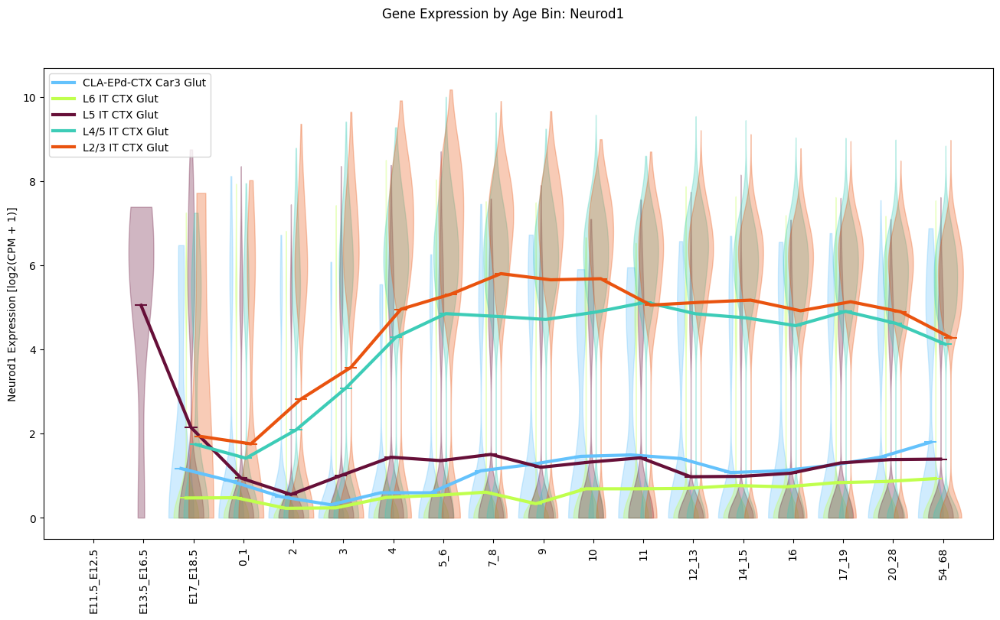

In [20]:
fig, ax = plot_gene_expression_by_age_bin(
    cell_metadata_df=cell_extended,
    gene_name='Neurod1',
    celltype_names=it_glut_subclass_list,
    taxonomy_level='subclass',
    figsize=(16, 8)
)

Finally we show the expression of the gene Olig2 this time with Glia cell types. The solid lines are again the mean log2 expression in each age bin.

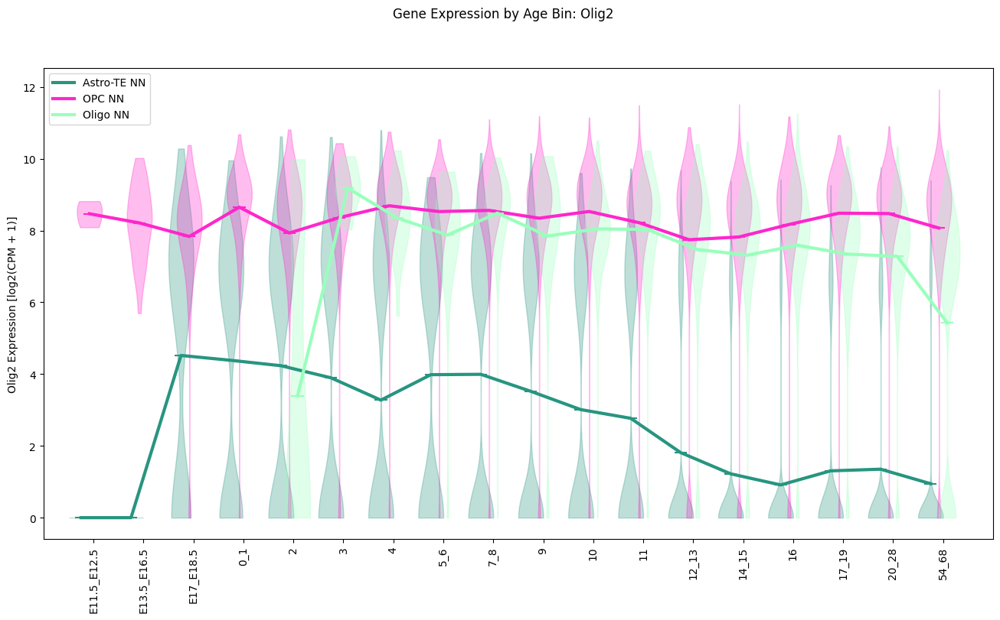

In [21]:
fig, ax = plot_gene_expression_by_age_bin(
    cell_metadata_df=cell_extended,
    gene_name='Olig2',
    celltype_names=glia_subclass_list,
    taxonomy_level='subclass',
    figsize=(16, 8)
)

Check out the previous exploration of the taxonomy and clustering annotations [here](https://alleninstitute.github.io/abc_atlas_access/notebooks/dev_mouse_vis_cortex_clustering_analysis_and_annotation.html). You can find similar notebooks for Whole Mouse Brain, 10X data [here](https://alleninstitute.github.io/abc_atlas_access/descriptions/notebook_subtitle1.html).